In [1]:
import pandas as pd
pd.set_option('precision', 4)

import numpy as np
import math
import itertools
import seaborn as sns
import time

from glob import glob
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

from scipy import stats
import gc

import folium
import folium.plugins as plugins

In [2]:
def basic_details(df):
    print('Row:{}, columns:{}'.format(df.shape[0],df.shape[1]))
    k = pd.DataFrame()
    k['number of Unique value'] = df.nunique()
    k['Number of missing value'] = df.isnull().sum()
    k['Data type'] = df.dtypes
    return k

# Import Data

In [330]:
# business=pd.read_csv('/Users/hillarymahoney/Downloads/yelp_business.csv')
business=pd.read_csv('/Users/hillarymahoney/Documents/Predict 498/Final Project/business_final.csv')
business_attributes=pd.read_csv('/Users/hillarymahoney/Downloads/yelp_business_attributes.csv')
business_hours=pd.read_csv('/Users/hillarymahoney/Downloads/yelp_business_hours.csv')
reviews=pd.read_csv('/Users/hillarymahoney/Downloads/yelp_review.csv')

In [207]:
demographics=pd.read_csv('/Users/hillarymahoney/Downloads/Census.csv')

#### Create list of city values

In [331]:
phx_list=['Phoenix','Pheonix AZ','Phoeniix','Phoenix AZ','Phoenix metro area','Phoenix Valley','Phoenix,','Phoenix, AZ','Phoneix','Phoniex','Phx']


In [209]:
phx_demographics=demographics[demographics.primary_City.isin(phx_list)]
print(phx_demographics.shape)

print(phx_demographics['zcta'].nunique())

(45, 122)
45


In [332]:
phx_business = business[business.city.isin(phx_list)]
#phx_business=business.loc[business['city']=='Phoenix']
phx_business.shape

(3284, 22)

# Explore Demographic Data

In [8]:
phx_demographics.head()

,zcta,primary_City,state,primary_County,land_Area,water_Area,pop_2010,pop_2000,pop_Density,pop_Est_ACS,...,hu_1970_1979,hu_1960_1969,hu_1950_1959,hu_1940_1949,hU_Before_1940,avg_Home_Value,med_Home_Value,avg_Rent,med_Rent,latLong
3518,13135,Phoenix,NY,Oswego,32,1.1,6617,5750,207.1,7055,...,361,213,348,97,827,137086,97900,0,623,"43.244353000000004, -76.315682"
6398,21131,Phoenix,MD,Baltimore,22,1.6,7253,7661,326.3,7603,...,437,630,285,0,93,630841,596200,0,2001,"39.505875, -76.57092800000001"
28923,85003,Phoenix,AZ,Maricopa,2,0.0,9369,9252,5061.0,9384,...,140,357,636,693,1275,314845,313300,0,633,"33.450893, -112.078331"
28924,85004,Phoenix,AZ,Maricopa,2,0.0,4965,4608,2434.0,4173,...,98,375,369,362,421,305711,264900,0,662,"33.450881, -112.070618"
28925,85006,Phoenix,AZ,Maricopa,4,0.0,25742,31616,6595.0,23931,...,1152,1073,1593,2309,2264,173198,151600,0,696,"33.465234, -112.048771"


In [9]:
for col in phx_demographics.columns:
    print(col)

zcta
primary_City
state
primary_County
land_Area
water_Area
pop_2010
pop_2000
pop_Density
pop_Est_ACS
pop_Est_Factor
pop_Est_Level
poverty_Pct
group_Qtrs_Pct
college_Pct
degree_Pct
foreign_Pct
hH_Total
hH_Size
hH_Est
hH_Avg_Income
hH_Med_Income
hH_Earnings
hH_Earnings_Amt
hH_Retire
hH_Retire_Amt
hh_ss
hH_SS_Amt
hh_ssi
hH_SSI_Amt
hH_Cash_Assist
hH_Cash_Assist_Amt
hH_Food_Stamps
family_Total
family_Size
family_Est
family_Avg_Income
family_Med_Income
per_Cap_Income
median_Age
median_Age_M
median_Age_F
hispanic
not_Hispanic
white
black
indian
asian
hawaiian
other_Race
multi_Race
tot_Males
males_0_4
males_5_9
males_10_14
males_15_19
males_20_24
males_25_29
males_30_34
males_35_39
males_40_44
males_45_49
males_50_54
males_55_59
males_60_64
males_65_69
males_70_74
males_75_79
males_80_84
males_85_89
males_90_Up
tot_Females
females_0_4
females_5_9
females_10_14
females_15_19
females_20_24
females_25_29
females_30_34
females_35_39
females_40_44
females_45_49
females_50_54
females_55_59
females_

join on zip code??

In [10]:
phx_demographics.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
zcta,45,NaN,NaN,NaN,8.229e+04,1.436e+04,1.314e+04,8.502e+04,8.503e+04,8.504e+04,9.754e+04
primary_City,45,1,Phoenix,45,NaN,NaN,NaN,NaN,NaN,NaN,NaN
state,45,4,AZ,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN
primary_County,45,4,Maricopa,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN
land_Area,45,NaN,NaN,NaN,11.29,10.01,2,5,9,14,58
water_Area,45,NaN,NaN,NaN,0.1956,0.3045,0,0,0.1,0.3,1.6
pop_2010,45,NaN,NaN,NaN,2.96e+04,1.598e+04,4965,1.81e+04,3.056e+04,4.038e+04,6.548e+04
pop_2000,45,NaN,NaN,NaN,2.731e+04,1.854e+04,0,8665,2.873e+04,3.989e+04,6.919e+04
pop_Density,45,NaN,NaN,NaN,3767,2359,207.1,1838,3371,5467,8700
pop_Est_ACS,45,NaN,NaN,NaN,2.973e+04,1.629e+04,4173,1.709e+04,3.018e+04,4.061e+04,7.115e+04


# Explore Yelp Data

### Explore Business hour data

In [160]:
business_hours.head(50)

,business_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday
0,FYWN1wneV18bWNgQjJ2GNg,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,None,None
1,He-G7vWjzVUysIKrfNbPUQ,9:0-20:0,9:0-20:0,9:0-20:0,9:0-20:0,9:0-16:0,8:0-16:0,None
2,KQPW8lFf1y5BT2MxiSZ3QA,None,None,None,None,None,None,None
3,8DShNS-LuFqpEWIp0HxijA,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,11:0-19:0
4,PfOCPjBrlQAnz__NXj9h_w,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-2:0,11:0-0:0
5,o9eMRCWt5PkpLDE0gOPtcQ,18:0-0:0,18:0-0:0,18:0-0:0,18:0-0:0,18:0-0:0,18:0-0:0,None
6,kCoE3jvEtg6UVz5SOD3GVw,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,None,None
7,OD2hnuuTJI9uotcKycxg1A,11:0-19:0,11:0-19:0,11:0-19:0,11:0-19:0,11:0-19:0,10:0-18:0,11:0-16:0
8,EsMcGiZaQuG1OOvL9iUFug,None,None,None,None,None,None,None
9,TGWhGNusxyMaA4kQVBNeew,9:0-18:0,9:0-18:0,9:0-18:0,9:0-18:0,9:0-18:0,9:0-18:0,9:0-18:0


In [236]:
#Replace all 'None' in business hours df
cols_v = list(business_hours.columns.values)[1:]

for i in range(len(cols_v)):
    #print(cols_v[i])
    business_hours[cols_v[i]].replace('None', np.nan, inplace=True)

In [237]:
basic_details(business_hours)

Row:174567, columns:8


,number of Unique value,Number of missing value,Data type
business_id,174567,0,object
monday,1395,55693,object
tuesday,1401,48309,object
wednesday,1406,47130,object
thursday,1442,46631,object
friday,1512,47134,object
saturday,1443,61543,object
sunday,1290,90934,object


In [238]:
## function for get time_range from string
def get_time_range(s):
    if isinstance(s, str):
        t1, t2 = s.split('-')
        h1, m1 = map(int, t1.split(':'))
        h2, m2 = map(int, t2.split(':'))
        m1, m2 = m1/60, m2/60
        t1, t2 = h1+m1, h2+m2
        if t2 < t1:
            d = t2+24-t1
        else:
            d = t2-t1
        return t1, t2, d
    else:
        return None, None, None

In [239]:
## Prepare start/finish/delta features for every weekday
bh_colnames = business_hours.columns
for c in bh_colnames[1:]:
    business_hours['{0}_s'.format(c[:2])] = business_hours[c].apply(lambda d: get_time_range(d)[0])
    business_hours['{0}_f'.format(c[:2])] = business_hours[c].apply(lambda d: get_time_range(d)[1])
    business_hours['{0}_d'.format(c[:2])] = business_hours[c].apply(lambda d: get_time_range(d)[2])
# business_hours = business_hours.drop(bh_colnames[1:], axis=1)
business_hours

,business_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,mo_s,mo_f,...,th_d,fr_s,fr_f,fr_d,sa_s,sa_f,sa_d,su_s,su_f,su_d
0,FYWN1wneV18bWNgQjJ2GNg,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,NaN,NaN,7.0,17.0,...,10.0,7.0,17.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN
1,He-G7vWjzVUysIKrfNbPUQ,9:0-20:0,9:0-20:0,9:0-20:0,9:0-20:0,9:0-16:0,8:0-16:0,NaN,9.0,20.0,...,11.0,9.0,16.0,7.0,8.0,16.0,8.0,NaN,NaN,NaN
2,KQPW8lFf1y5BT2MxiSZ3QA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8DShNS-LuFqpEWIp0HxijA,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,11:0-19:0,10.0,21.0,...,11.0,10.0,21.0,11.0,10.0,21.0,11.0,11.0,19.0,8.0
4,PfOCPjBrlQAnz__NXj9h_w,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-2:0,11:0-0:0,11.0,1.0,...,14.0,11.0,1.0,14.0,11.0,2.0,15.0,11.0,0.0,13.0
5,o9eMRCWt5PkpLDE0gOPtcQ,18:0-0:0,18:0-0:0,18:0-0:0,18:0-0:0,18:0-0:0,18:0-0:0,NaN,18.0,0.0,...,6.0,18.0,0.0,6.0,18.0,0.0,6.0,NaN,NaN,NaN
6,kCoE3jvEtg6UVz5SOD3GVw,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,NaN,NaN,8.0,17.0,...,9.0,8.0,17.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN
7,OD2hnuuTJI9uotcKycxg1A,11:0-19:0,11:0-19:0,11:0-19:0,11:0-19:0,11:0-19:0,10:0-18:0,11:0-16:0,11.0,19.0,...,8.0,11.0,19.0,8.0,10.0,18.0,8.0,11.0,16.0,5.0
8,EsMcGiZaQuG1OOvL9iUFug,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,TGWhGNusxyMaA4kQVBNeew,9:0-18:0,9:0-18:0,9:0-18:0,9:0-18:0,9:0-18:0,9:0-18:0,9:0-18:0,9.0,18.0,...,9.0,9.0,18.0,9.0,9.0,18.0,9.0,9.0,18.0,9.0


/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


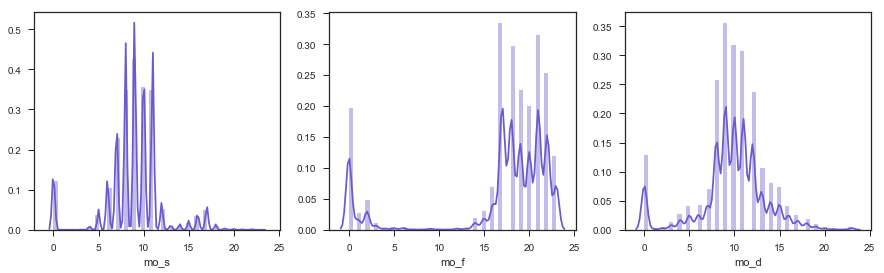

In [320]:
#subset data for plots
f, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(15, 4), sharex=True)
sns.distplot(b_hours['mo_s'].dropna(), color='slateblue', ax=ax1, label='monday_start_times')
sns.distplot(b_hours['mo_f'].dropna(), color='slateblue', ax=ax2, label='monday_start_times')
sns.distplot(b_hours['mo_d'].dropna(), color='slateblue', ax=ax3, label='monday_start_times')

plt.show()

/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


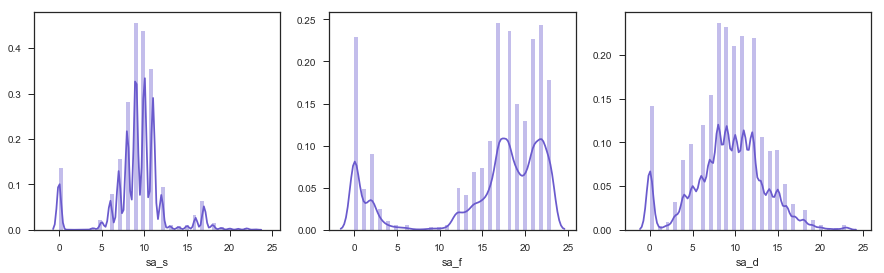

In [322]:
#subset data for plots
f, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(15, 4), sharex=True)
sns.distplot(b_hours['sa_s'].dropna(), color='slateblue',ax=ax1, label='sunday_start_times')
sns.distplot(b_hours['sa_f'].dropna(), color='slateblue',ax=ax2, label='sunday_start_times')
sns.distplot(b_hours['sa_d'].dropna(), color='slateblue',ax=ax3, label='sunday_start_times')

plt.show()

/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


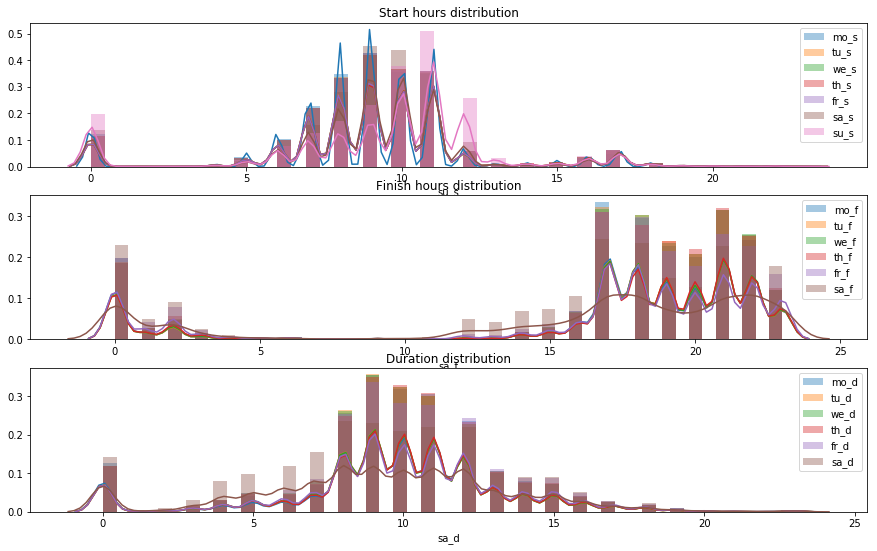

In [98]:
wkday=b_hours.iloc[:,1:20]


fig, [ax1, ax2, ax3] = plt.subplots(3, 1, figsize=[15, 9])
for wd in [c for c in wkday.columns if '_s' in c]:  
    sns.distplot(wkday[wd].dropna(), ax=ax1, label=wd)
for wd in [c for c in wkday.columns if '_f' in c]:  
    sns.distplot(wkday[wd].dropna(), ax=ax2, label=wd)
for wd in [c for c in wkday.columns if '_d' in c]:  
    sns.distplot(wkday[wd].dropna(), ax=ax3, label=wd)
ax1.legend()
ax2.legend()
ax3.legend()
ax1.set_title('Start hours distribution')
ax2.set_title('Finish hours distribution')
ax3.set_title('Duration distribution')
plt.show()

In [99]:
# # define weekday vs weekend categories
# weekdays = ['mo', 'tu', 'we', 'th']
# fridays = ['fr']
# weekends = ['sa', 'su']

# ## define new_cols
# bh_newcols = ['business_id']
# for wg_name, wg in zip(['weekdays', 'fridays', 'weekends'], [weekdays, fridays, weekends]):
#     for f in ['s', 'f', 'd']:
#         cols = list(map(lambda d: '{0}_{1}'.format(d,f), wg))
#         bh_newcols.append('{0}_{1}'.format(wg_name, f))
#         b_hours['{0}_{1}'.format(wg_name, f)] = b_hours.loc[:, cols].median(axis=1)

# b_hours.loc[:, bh_newcols].head(30)

In [243]:
# weekdays = ['monday', 'tuesday', 'wednesday', 'thursday']
# fridays = ['friday']
# weekends = ['saturday', 'sunday']

business_hours['monday']=np.where(business_hours.monday.notnull(),1,0)
business_hours['tuesday']=np.where(business_hours.tuesday.notnull(),1,0)
business_hours['wednesday']=np.where(business_hours.wednesday.notnull(),1,0)
business_hours['thursday']=np.where(business_hours.thursday.notnull(),1,0)
business_hours['friday']=np.where(business_hours.friday.notnull(),1,0)
business_hours['saturday']=np.where(business_hours.saturday.notnull(),1,0)
business_hours['sunday']=np.where(business_hours.sunday.notnull(),1,0)

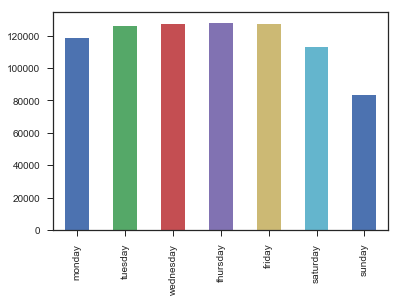

In [244]:
business_hours[['monday','tuesday','wednesday','thursday','friday','saturday','sunday']].sum().plot.bar()
plt.show()

In [245]:
business_hours['open_weekdays'] = np.where((business_hours['monday']==1) & 
                                           (business_hours['tuesday']==1) & 
                                           (business_hours['wednesday']==1) & 
                                           (business_hours['thursday']==1),1,0)
business_hours['open_fridays']=np.where(business_hours['friday']==1,1,0)
business_hours['open_weekends']=np.where((business_hours['saturday']==1)|
                                         (business_hours['sunday']==1),1,0)

business_hours

,business_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,mo_s,mo_f,...,fr_d,sa_s,sa_f,sa_d,su_s,su_f,su_d,open_weekdays,open_fridays,open_weekends
0,FYWN1wneV18bWNgQjJ2GNg,1,1,1,1,1,0,0,7.0,17.0,...,10.0,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0
1,He-G7vWjzVUysIKrfNbPUQ,1,1,1,1,1,1,0,9.0,20.0,...,7.0,8.0,16.0,8.0,NaN,NaN,NaN,1,1,1
2,KQPW8lFf1y5BT2MxiSZ3QA,0,0,0,0,0,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
3,8DShNS-LuFqpEWIp0HxijA,1,1,1,1,1,1,1,10.0,21.0,...,11.0,10.0,21.0,11.0,11.0,19.0,8.0,1,1,1
4,PfOCPjBrlQAnz__NXj9h_w,1,1,1,1,1,1,1,11.0,1.0,...,14.0,11.0,2.0,15.0,11.0,0.0,13.0,1,1,1
5,o9eMRCWt5PkpLDE0gOPtcQ,1,1,1,1,1,1,0,18.0,0.0,...,6.0,18.0,0.0,6.0,NaN,NaN,NaN,1,1,1
6,kCoE3jvEtg6UVz5SOD3GVw,1,1,1,1,1,0,0,8.0,17.0,...,9.0,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0
7,OD2hnuuTJI9uotcKycxg1A,1,1,1,1,1,1,1,11.0,19.0,...,8.0,10.0,18.0,8.0,11.0,16.0,5.0,1,1,1
8,EsMcGiZaQuG1OOvL9iUFug,0,0,0,0,0,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
9,TGWhGNusxyMaA4kQVBNeew,1,1,1,1,1,1,1,9.0,18.0,...,9.0,9.0,18.0,9.0,9.0,18.0,9.0,1,1,1


In [211]:
#look at businesses where Fri,Sat, and Sun are all = 0 compared to Friday=1
# wknd=b_hours[['business_id','friday','saturday','sunday']]
# fri=wknd[(wknd.friday==1)&(wknd.saturday==0)&(wknd.sunday==0)]
# fri2=wknd[(wknd.friday==0)&(wknd.saturday==0)&(wknd.sunday==0)]
# print(len(wknd),len(fri),len(fri2),(100*len(fri)/len(fri2)))

In [246]:
#break categories down further
#breakfast: 5 a.m. to 10:30 a.m.
#lunch: 11 a.m. to 3:30 p.m.
#dinner: 4 p.m. to 9:30 p.m.
#late_night: 10 p.m. to 4:30 a.m.

business_hours['weekday_breakfast']=np.where(
    (business_hours['mo_s']> 4.5)&(business_hours['mo_s']<10.5)|
    (business_hours['tu_s']> 4.5)&(business_hours['tu_s']<10.5)|
    (business_hours['we_s']> 4.5)&(business_hours['we_s']<10.5)|
    (business_hours['th_s']> 4.5)&(business_hours['th_s']<10.5)|
    (business_hours['fr_s']> 4.5)&(business_hours['fr_s']<10.5),1,0)

business_hours['weekend_breakfast']=np.where(
    (business_hours['sa_s']> 4.5)&(business_hours['sa_s']<10.5)|
    (business_hours['su_s']> 4.5)&(business_hours['su_s']<10.5),1,0)

business_hours['weekday_lunch']=np.where(
    (business_hours['mo_s']< 10.5)&(business_hours['mo_f']>15.5)|
    (business_hours['tu_s']< 10.5)&(business_hours['tu_f']>15.5)|
    (business_hours['we_s']< 10.5)&(business_hours['we_f']>15.5)|
    (business_hours['th_s']< 10.5)&(business_hours['th_f']>15.5)|
    (business_hours['fr_s']< 10.5)&(business_hours['fr_f']>15.5),1,0)

business_hours['weekend_lunch']=np.where(
    (business_hours['sa_s']< 11)&(business_hours['sa_f']>15.5)|
    (business_hours['su_s']< 11)&(business_hours['su_f']>15.5),1,0)

business_hours['weekday_dinner']=np.where(
    (business_hours['mo_s']< 15.5)&(business_hours['mo_f']>20)|
    (business_hours['tu_s']< 15.5)&(business_hours['tu_f']>20)|
    (business_hours['we_s']< 15.5)&(business_hours['we_f']>20)|
    (business_hours['th_s']< 15.5)&(business_hours['th_f']>20)|
    (business_hours['fr_s']< 15.5)&(business_hours['fr_f']>20),1,0)

business_hours['weekend_dinner']=np.where(
    (business_hours['sa_s']< 15.5)&(business_hours['sa_f']>20)|
    (business_hours['su_s']< 15.5)&(business_hours['su_f']>20),1,0)

business_hours['weekday_late_night']=np.where(
    (business_hours['mo_s']< 23.5)&(business_hours['mo_f']<4)|
    (business_hours['tu_s']< 23.5)&(business_hours['tu_f']<4)|
    (business_hours['we_s']< 23.5)&(business_hours['we_f']<4)|
    (business_hours['th_s']< 23.5)&(business_hours['th_f']<4)|
    (business_hours['fr_s']< 23.5)&(business_hours['fr_f']<4),1,0)

business_hours['weekend_late_night']=np.where(
    (business_hours['sa_s']< 23.5)&(business_hours['sa_f']<4)|
    (business_hours['su_s']< 23.5)&(business_hours['su_f']<4),1,0)

business_hours

,business_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,mo_s,mo_f,...,open_fridays,open_weekends,weekday_breakfast,weekend_breakfast,weekday_lunch,weekend_lunch,weekday_dinner,weekend_dinner,weekday_late_night,weekend_late_night
0,FYWN1wneV18bWNgQjJ2GNg,1,1,1,1,1,0,0,7.0,17.0,...,1,0,1,0,1,0,0,0,0,0
1,He-G7vWjzVUysIKrfNbPUQ,1,1,1,1,1,1,0,9.0,20.0,...,1,1,1,1,1,1,0,0,0,0
2,KQPW8lFf1y5BT2MxiSZ3QA,0,0,0,0,0,0,0,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3,8DShNS-LuFqpEWIp0HxijA,1,1,1,1,1,1,1,10.0,21.0,...,1,1,1,1,1,1,1,1,0,0
4,PfOCPjBrlQAnz__NXj9h_w,1,1,1,1,1,1,1,11.0,1.0,...,1,1,0,0,0,0,0,0,1,1
5,o9eMRCWt5PkpLDE0gOPtcQ,1,1,1,1,1,1,0,18.0,0.0,...,1,1,0,0,0,0,0,0,1,1
6,kCoE3jvEtg6UVz5SOD3GVw,1,1,1,1,1,0,0,8.0,17.0,...,1,0,1,0,1,0,0,0,0,0
7,OD2hnuuTJI9uotcKycxg1A,1,1,1,1,1,1,1,11.0,19.0,...,1,1,0,1,0,1,0,0,0,0
8,EsMcGiZaQuG1OOvL9iUFug,0,0,0,0,0,0,0,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
9,TGWhGNusxyMaA4kQVBNeew,1,1,1,1,1,1,1,9.0,18.0,...,1,1,1,1,1,1,0,0,0,0


### Explore Business Attributes

In [212]:
#Replace all True/False to 1/0 in Business Attributes
cols_v = list(business_attributes.columns.values)[1:]

for i in range(len(cols_v)):
    #print(cols_v[i])
    business_attributes[cols_v[i]].replace('Na', np.nan, inplace=True)
    business_attributes[cols_v[i]].replace('True', 1, inplace=True)
    business_attributes[cols_v[i]].replace('False', 0, inplace=True)

In [308]:
percent_missing = (business_attributes.isnull().sum() * 100 / len(business_attributes)).sort_values()
percent_missing

business_id                         0.0000
BusinessParking_street             74.1162
BusinessParking_validated          74.1162
BusinessParking_valet              74.1162
HairSpecializesIn_coloring         74.1162
BikeParking                        74.1635
BusinessParking_lot                74.8048
BusinessAcceptsCreditCards         84.4904
WheelchairAccessible               86.2050
BusinessParking_garage             86.5878
Alcohol                            93.1518
HappyHour                          95.9340
DogsAllowed                        96.0504
GoodForKids                        96.5115
BestNights_monday                  97.9657
HasTV                              98.1360
RestaurantsReservations            98.4524
RestaurantsTableService            98.4978
Caters                             98.5734
GoodForMeal_breakfast              98.8069
GoodForMeal_dinner                 98.8069
GoodForMeal_lunch                  98.8069
GoodForMeal_latenight              98.8069
CoatCheck  

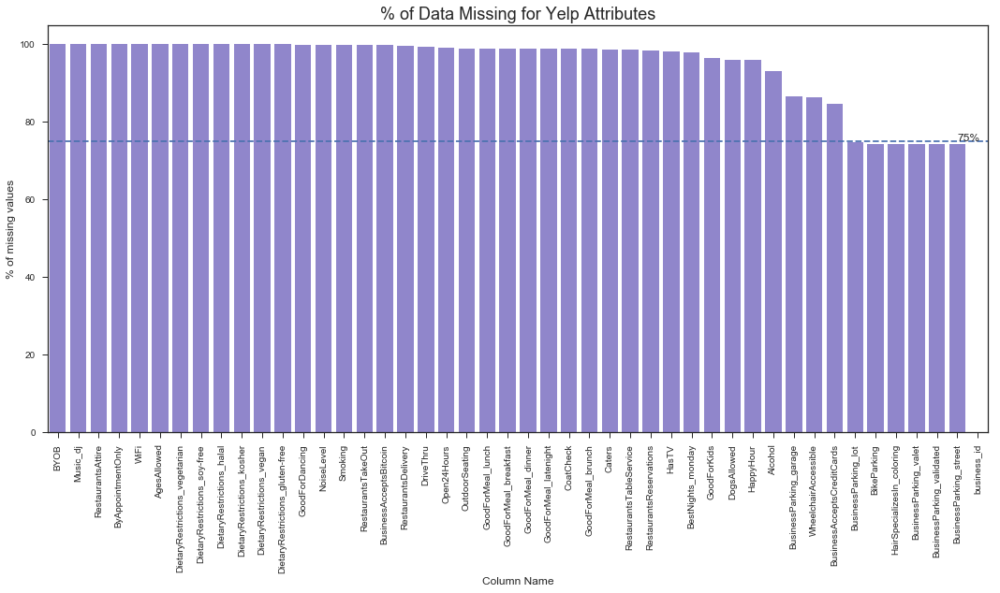

In [319]:
x=percent_missing.sort_values(ascending=False)
# x=percent_missing.iloc[0:25]

#chart
plt.figure(figsize=(18,8))
ax = sns.barplot(x.index, x.values, alpha=0.8,color='slateblue')
plt.title("% of Data Missing for Yelp Attributes",fontsize=18)
locs, labels = plt.xticks()
plt.setp(labels, rotation=90)
plt.ylabel('% of missing values', fontsize=12)
plt.xlabel('Column Name', fontsize=12)

#adding the text labels
# rects = ax.patches
# for rect, label in zip(rects, labels):
#     height = rect.get_height()
#     ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
ax.axhline(75, ls='--')
ax.text(44,75, "75%")

plt.show()


In [278]:
max_percent_of_nas = 99
bus_atts = business_attributes.loc[:, (((business_attributes.isnull().sum(axis=0)*100)/len(business_attributes)) <= max_percent_of_nas)]
bus_atts=bus_atts.drop('HairSpecializesIn_coloring',axis=1)


### Explore Business Data

In [172]:
#How many categories do we have?
categories = pd.concat(
    [pd.Series(row['business_id'], row['categories'].split(';')) for _, row in phx_business.iterrows()]
).reset_index()
categories.columns = ['category', 'business_id']

In [13]:
x=categories.category.value_counts()
print("There are ",len(x)," different types/categories in Phoenix")


('There are ', 1062, ' different types/categories in Phoenix')


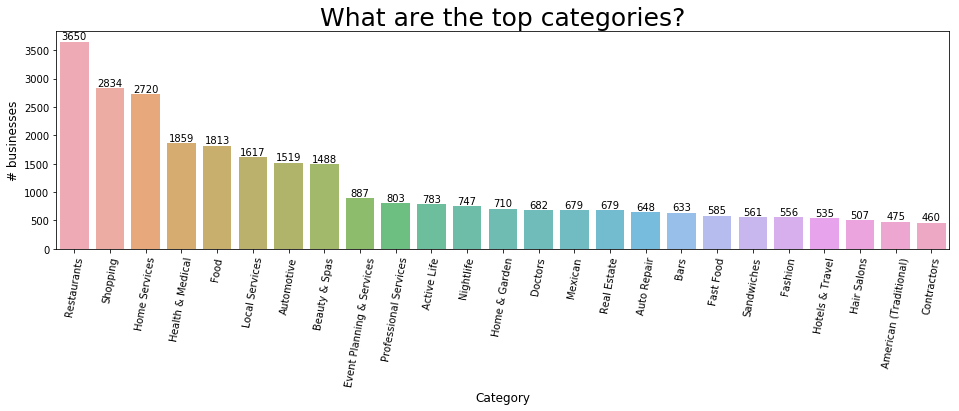

In [14]:
#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[0:25]

#chart
plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha=0.8)#,color=color[5])
plt.title("What are the top categories?",fontsize=25)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()


In [271]:
#filter for restaurants
#list of key words: Restuarants, Food, Restaurant
phx_businesses=phx_business[phx_business['categories'].str.contains('Restaurants') | 
                            phx_business['categories'].str.contains('Restaurant')]
phx_businesses.shape

(3655, 13)

In [338]:
#determine chain restaurants
phx_business['chain_restaurant'] = phx_business.duplicated(['name'])

phx_business

/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,...,cat,Fast Food,Bars,Gluten-Free,Vegetarian,Vegan,Pizza,temp,chain,chain_restaurant
0,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""",NaN,"""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,...,Burgers,True,False,False,False,False,False,False,Chain,False
1,1WBkAuQg81kokZIPMpn9Zg,"""Charr An American Burger Bar""",NaN,"""777 E Thunderbird Rd, Ste 107""",Phoenix,AZ,85022,33.6073,-112.0634,3.0,...,Burgers,False,False,False,False,False,False,False,Non-Chain,False
2,iPa__LOhse-hobC2Xmp-Kw,"""McDonald's""",NaN,"""1635 E Camelback Rd""",Phoenix,AZ,85016,33.5088,-112.0462,3.0,...,Burgers,True,False,False,False,False,False,False,Chain,True
3,QkG3KUXwqZBW18A9k1xqCA,"""Red Lobster""",NaN,"""2810 North 75th Ave""",Phoenix,AZ,85035,33.4787,-112.2214,2.5,...,Seafood,False,False,False,False,False,False,False,Chain,False
4,5XejqzaFmtkZMstJS5Iy-w,"""D'Lish Cafe""",NaN,"""503 W Thomas Rd""",Phoenix,AZ,85013,33.4803,-112.0806,4.0,...,Cafe,False,False,False,False,True,False,False,Non-Chain,False
5,2v-8QQfMLX2PCz-0S6gISQ,"""Papa John's Pizza""",NaN,"""3441 W Northern Ave""",Phoenix,AZ,85051,33.5529,-112.1337,2.5,...,Pizza,True,False,False,False,False,True,False,Chain,False
6,M3uV9Y3EDSpy9d4YwyNSAQ,"""Yakiramen""",NaN,"""10605 N 43rd Ave""",Phoenix,AZ,85029,33.5824,-112.1499,4.0,...,Japanese,False,True,False,False,False,False,False,Non-Chain,False
7,U1ZVgF-kfkvv_rcoe0RglQ,"""Pho Noodles""",NaN,"""3417 N 7th Ave""",Phoenix,AZ,85013,33.4888,-112.0824,4.5,...,Vietnamese,False,False,False,False,False,False,False,Non-Chain,False
8,FfI9FOaQqzUxixw6_glt3Q,"""Affinito's Bistro""",NaN,"""3655 W Anthem Way, Ste C-137""",Phoenix,AZ,85086,33.8650,-112.1388,3.0,...,Italian,False,False,False,False,False,False,False,Non-Chain,False
9,3b4efqz06QrLQ_w2xLc4pA,"""Olive Garden Italian Restaurant""",NaN,"""10223 N Metro Parkway E""",Phoenix,AZ,85051,33.5803,-112.1197,3.0,...,Italian,False,False,False,False,False,False,False,Chain,False


In [339]:
dfs = [phx_business, bus_atts, business_hours, reviews] # list of dataframes

df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['business_id'],
                                            how='left'), dfs)
df_merged=df_merged.drop(['neighborhood'],axis=1)
print(df_merged.shape)
df_merged.head(50)
# if you want to fill the values that don't exist in the lines of merged dataframe simply fill with required strings as

#df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['business_id'],
#                                            how='left'), data_frames).fillna('void')

(293667, 93)


,business_id,name,address,city,state,postal_code,latitude,longitude,stars_x,review_count,...,weekday_late_night,weekend_late_night,review_id,user_id,stars_y,date,text,useful,funny,cool
0,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,bABGON0ehmb7MBJrI02l7Q,Ck73f1qtZbu68F_vjzsBrQ,1.0,2016-02-25,The speed of delivery of my food order was ter...,3.0,0.0,0.0
1,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,zn7bEYAVzwWSJdSd2a4zoQ,u0JoB0Vm1ZhwF8nysxPnfg,2.0,2011-06-06,"McDonald's is McDonald's. My ""beef"" with this ...",6.0,7.0,4.0
2,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,ONnRwv_KOLRyKyk72SzTHg,F95NFEFwuwA__SIRt9IJNA,1.0,2015-11-05,I stopped by for a double quarter pounder with...,2.0,0.0,0.0
3,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,wlcWp7STNY0Ccnpap2_Nzw,uHZxYHgjxhXY7PS6g2rFsA,1.0,2012-06-17,Was there Friday morning around 9am- rudest yo...,1.0,0.0,0.0
4,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,0BsbVLK2dLyT55Nw-omXRA,Akt0llUBaVa1Qxi8Ogdv4Q,1.0,2011-08-12,went back there today and asked for two simple...,0.0,0.0,0.0
5,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,nSq8oldCoOHxhvfvc2D7SQ,2gWCW1oEuyhaxrlTTghvtQ,1.0,2017-08-27,I was told tonight at 8:30 pm that they were n...,0.0,0.0,0.0
6,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,HW8QHuEQ6zeWgORv8emQ-Q,yKyfDC9EPHvSuBXPCP-EmQ,1.0,2016-06-02,Cashier was disgusting and unsanitary. Picking...,2.0,0.0,0.0
7,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,TCsF4ONkAca67BTmQVEn1Q,wxu6RAQqre73_id5lALttA,1.0,2017-03-16,Don't waste your money! Terrible service. The...,0.0,0.0,0.0
8,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,jHkGa6QkTJPtyVg0_H0kYQ,Oaz5MJJpL9pT67gRJ1ipqw,1.0,2013-05-03,"The quest is over, we just found the slowest M...",1.0,3.0,0.0
9,rDMptJYWtnMhpQu_rRXHng,"""McDonald's""","""719 E Thunderbird Rd""",Phoenix,AZ,85022,33.6071,-112.0644,1.0,10,...,0.0,0.0,JKqKrlKGXU4jMTwcHK8nKQ,stYVxcPWGZcg4uzCZB7BUw,1.0,2015-11-17,Worst McDonald's ever. Unless you speak Spanis...,1.0,0.0,0.0


In [341]:
cols_v = list(df_merged.columns.values)[1:]

for i in range(len(cols_v)):
    #print(cols_v[i])
    df_merged[cols_v[i]].replace('Na', np.nan, inplace=True)
    df_merged[cols_v[i]].replace('True', 1, inplace=True)
    df_merged[cols_v[i]].replace('False', 0, inplace=True)
    df_merged[cols_v[i]].replace('Chain', 1, inplace=True)
    df_merged[cols_v[i]].replace('Non-Chain', 0, inplace=True)

for col in df_merged.columns:
    print(col)

business_id
name
address
city
state
postal_code
latitude
longitude
stars_x
review_count
is_open
categories
cat
Fast Food
Bars
Gluten-Free
Vegetarian
Vegan
Pizza
temp
chain
chain_restaurant
BusinessAcceptsCreditCards
BusinessParking_garage
BusinessParking_street
BusinessParking_validated
BusinessParking_lot
BusinessParking_valet
GoodForKids
WheelchairAccessible
BikeParking
Alcohol
HasTV
Caters
RestaurantsReservations
HappyHour
RestaurantsTableService
OutdoorSeating
BestNights_monday
GoodForMeal_latenight
GoodForMeal_lunch
GoodForMeal_dinner
GoodForMeal_breakfast
GoodForMeal_brunch
CoatCheck
DogsAllowed
monday
tuesday
wednesday
thursday
friday
saturday
sunday
mo_s
mo_f
mo_d
tu_s
tu_f
tu_d
we_s
we_f
we_d
th_s
th_f
th_d
fr_s
fr_f
fr_d
sa_s
sa_f
sa_d
su_s
su_f
su_d
open_weekdays
open_fridays
open_weekends
weekday_breakfast
weekend_breakfast
weekday_lunch
weekend_lunch
weekday_dinner
weekend_dinner
weekday_late_night
weekend_late_night
review_id
user_id
stars_y
date
text
useful
funny
cool


In [274]:
# check missing data
percent_missing = (df_merged.isnull().sum() * 100 / len(df_merged)).sort_values()
percent_missing
# isna() produces same results as isnull()
# percent_missing = (df_merged.isna().sum() * 100 / len(df_merged)).sort_values()
# drop neighborhood column
#hours have 'None' value

business_id                    0.0000
wednesday                      0.0000
thursday                       0.0000
funny                          0.0000
saturday                       0.0000
sunday                         0.0000
open_weekdays                  0.0000
open_fridays                   0.0000
open_weekends                  0.0000
weekday_breakfast              0.0000
weekend_breakfast              0.0000
tuesday                        0.0000
weekday_lunch                  0.0000
weekday_dinner                 0.0000
weekend_dinner                 0.0000
weekday_late_night             0.0000
weekend_late_night             0.0000
review_id                      0.0000
user_id                        0.0000
stars_y                        0.0000
date                           0.0000
text                           0.0000
useful                         0.0000
weekend_lunch                  0.0000
monday                         0.0000
friday                         0.0000
cool        

In [ ]:
### df_merged.describe(include='all').T

In [342]:
## How many businesses in dataset?
print('Total restaurants:', df_merged['business_id'].nunique())

('Total restaurants:', 3222)


In [343]:
np.min(df_merged['date']), np.max(df_merged['date'])

(inf, '2017-12-11')

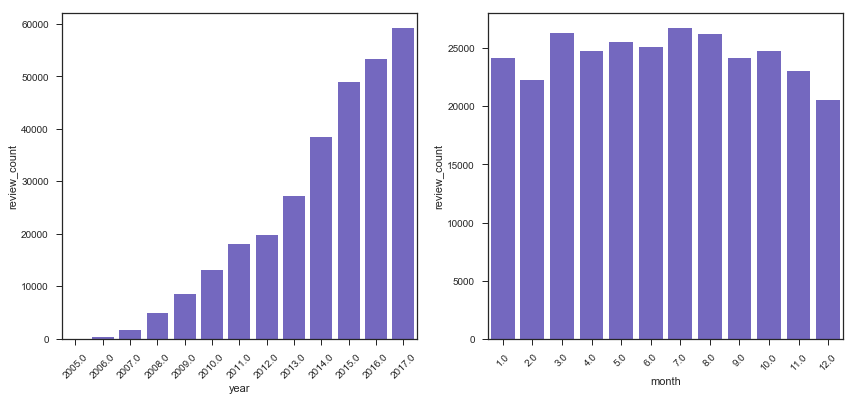

In [344]:
# plot reviews by year
df_merged['date'] = pd.to_datetime(df_merged['date'])
df_merged['year'] = df_merged['date'].dt.year
df_merged['month'] = df_merged['date'].dt.month

f,ax = plt.subplots(1,2, figsize = (14,6))
ax1,ax2 = ax.flatten()
cnt = df_merged.groupby('year').count()['review_count'].to_frame()
sns.barplot(cnt.index, cnt['review_count'],color='slateblue', ax=ax1)

for ticks in ax1.get_xticklabels():
    ticks.set_rotation(45)

cnt = df_merged.groupby('month').count()['review_count'].to_frame()
sns.barplot(cnt.index, cnt['review_count'],color='slateblue', ax = ax2)

for ticks in ax2.get_xticklabels():
    ticks.set_rotation(45)


In [345]:
df_merged['review_date'] = pd.to_datetime(df_merged['date'], format='%Y%m%d')
df_merged['month_review'] = df_merged.review_date.dt.to_period('M')

In [1]:
#Reviews per year and month

grp_date = df_merged.groupby(['review_date'])['business_id'].count()
grp_month = df_merged.groupby(['month_review'])['business_id'].count()
grp_star = df_merged.groupby(['month_review','stars_y'])['business_id'].count()

ts = pd.Series(grp_date)
ts.plot(kind='line', figsize=(20,10),title='Daily Reviews per Year', color='slateblue')
plt.title("Daily Reviews per Year",fontsize=14)
plt.show()

ts1 = pd.Series(grp_star)
ts1.plot(kind='line', figsize=(15,8),title='Reviews per month')
plt.show()

NameError: name 'df_merged' is not defined

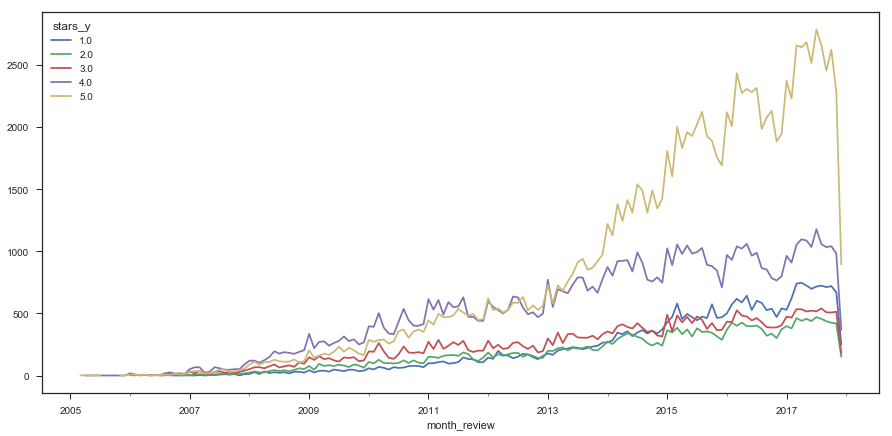

In [349]:
fig, ax = plt.subplots(figsize=(15,7))
# use unstack()
df_merged.groupby(['month_review','stars_y']).count()['business_id'].unstack().plot(ax=ax)

1    85.8871
0    14.1129
Name: is_open, dtype: float64


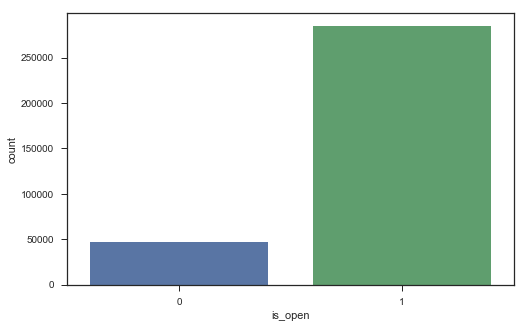

In [290]:
#how many businesses are open?
print(df_merged['is_open'].value_counts()*100/len(df_merged))
plt.figure(figsize=(8,5))
sns.countplot(df_merged['is_open'])

## Explore Zip Codes

Text(0.5,1,'Top 25 Zip Codes Ranked by Number of Businesses Listed')

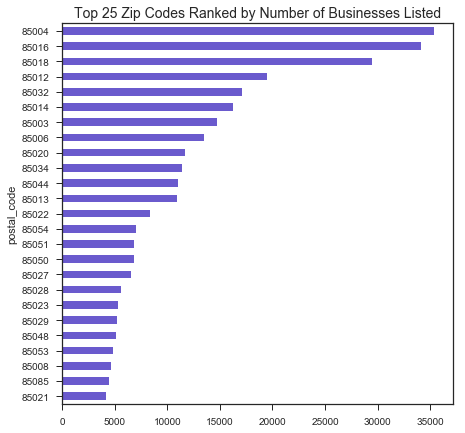

In [326]:
zipCode_business_counts = df_merged[['postal_code', 'business_id']].groupby(['postal_code'])\
['business_id'].agg('count').sort_values(ascending=False)

zipCode_business_counts.rename(columns={'business_id' : 'number_of_businesses'}, inplace=True)

zipCode_business_counts[0:25].sort_values(ascending=True)\
.plot(kind='barh', stacked=False, figsize=[7,7], color='slateblue')
plt.title('Top 25 Zip Codes Ranked by Number of Businesses Listed',fontsize=14)

Text(0.5,1,'Top 25 Zip Codes Ranked by Number of Reviews')

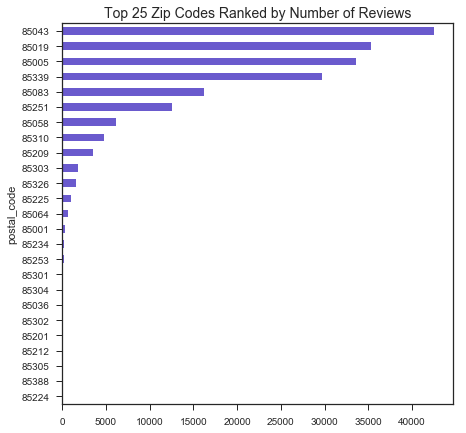

In [327]:
# look at ratings and reviews per zip code
zipCode_business_reviews = df_merged[['postal_code', 'review_count', 'stars_x']].groupby(['postal_code'])\
.agg({'review_count': 'sum', 'stars_x': 'mean', 'stars_x':'median'}).sort_values(by='review_count', ascending=True)


zipCode_business_reviews['review_count'][0:25].plot(kind='barh', stacked=False, figsize=[7,7],color='slateblue')
plt.title('Top 25 Zip Codes Ranked by Number of Reviews',fontsize=14)


Text(0.5,1,'Top 25 Zip Codes Ranked by Average Stars')

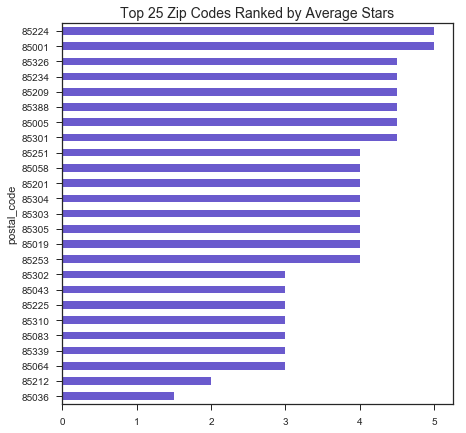

In [328]:
zipCode_business_reviews[zipCode_business_reviews.review_count > 5]['stars_x'][0:25].sort_values()\
.plot(kind='barh', stacked=False, figsize=[7,7],color='slateblue')

plt.title('Top 25 Zip Codes Ranked by Average Stars',fontsize=14)

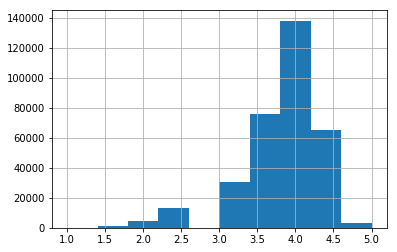

In [27]:
df_merged['stars_x'].hist()


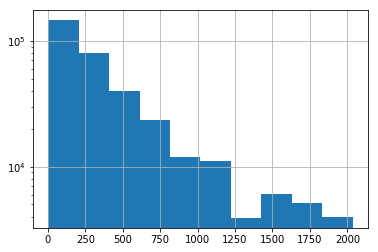

In [28]:
#df_merged['review_count'].hist()

#try transformation like log or logit
df_merged['review_count'].hist().set_yscale('log')


In [29]:
#add a column to the data set
df_merged['log_reviews']=np.log(df_merged['review_count']+0.1)

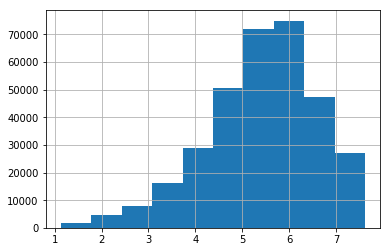

In [30]:
df_merged['log_reviews'].hist()

In [31]:
#geographically plot businesses and ratings
ratings=df_merged[['stars_x','review_count','latitude','longitude']]
#normalize data or create some sort of metric??
ratings['stars_per_100_reviews']=ratings['stars_x']*ratings['review_count']/100
ratings['popularity']=ratings['stars_x']*ratings['review_count']

ratings

/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,stars_x,review_count,latitude,longitude,stars_per_100_reviews,popularity
0,1.0,10,33.6071,-112.0644,0.10,10.0
1,1.0,10,33.6071,-112.0644,0.10,10.0
2,1.0,10,33.6071,-112.0644,0.10,10.0
3,1.0,10,33.6071,-112.0644,0.10,10.0
4,1.0,10,33.6071,-112.0644,0.10,10.0
5,1.0,10,33.6071,-112.0644,0.10,10.0
6,1.0,10,33.6071,-112.0644,0.10,10.0
7,1.0,10,33.6071,-112.0644,0.10,10.0
8,1.0,10,33.6071,-112.0644,0.10,10.0
9,1.0,10,33.6071,-112.0644,0.10,10.0


One of the reasons that it's easy to get confused between scaling and normalization is because the terms are sometimes used interchangeably and, to make it even more confusing, they are very similar! In both cases, you're transforming the values of numeric variables so that the transformed data points have specific helpful properties. The difference is that, in scaling, you're changing the range of your data while in normalization you're changing the shape of the distribution of your data.

This means that you're transforming your data so that it fits within a specific scale, like 0-100 or 0-1. You want to scale data when you're using methods based on measures of how far apart data points, like support vector machines, or SVM or k-nearest neighbors, or KNN. With these algorithms, a change of "1" in any numeric feature is given the same importance.

Scaling just changes the range of your data. Normalization is a more radical transformation. The point of normalization is to change your observations so that they can be described as a normal distribution.


/Users/hillarymahoney/anaconda2/lib/python2.7/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


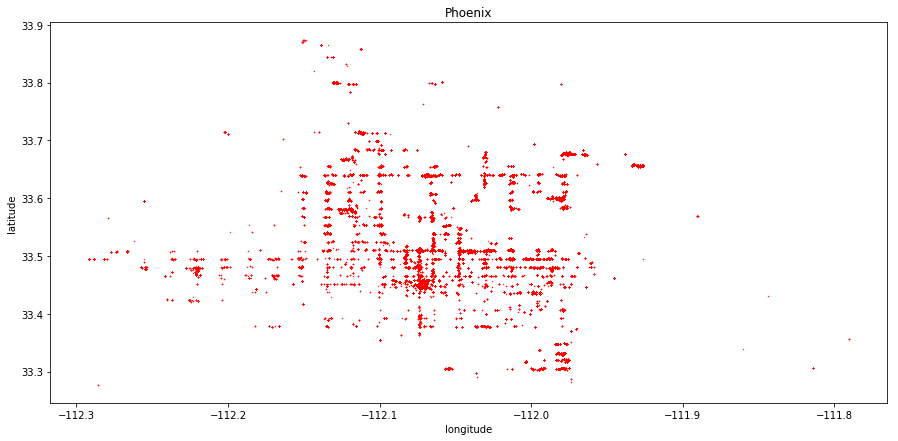

In [32]:
f, ax1=plt.subplots(1,1,figsize=(15,7))

#pick central point in Phoenix
lat = 33.435463
lon = -112.006989

lon_min, lon_max = lon-0.3, lon+0.5
lat_min, lat_max = lat-0.4, lat+0.5

ratings_phx=ratings[(ratings["longitude"]>lon_min) & (ratings["longitude"]<lon_max) & (ratings["latitude"]>lat_min) & (ratings["latitude"]<lat_max)]

ratings_phx.plot(kind='scatter',x='longitude',y='latitude', color='red',s=0.05, alpha=0.8, subplots=True, ax=ax1)
ax1.set_title("Phoenix")
f.show()

In [33]:
#rearrange data to use folium for mapping
df=[]
list_stars=list(ratings['stars_x'].unique())

for star in list_stars:
    subset=ratings_phx[ratings_phx['stars_x']==star]
    df.append(subset[['latitude','longitude']].values.tolist())

In [35]:
#use central points from scatter plot above
zoom_start=11
print("Phoenix Heat Map of Businesses")
m=folium.Map(location=[lat,lon],tiles="OpenStreetMap",zoom_start=zoom_start)

heat_map=plugins.HeatMapWithTime(df, max_opacity=0.4, auto_play=True, display_index=True, radius=7)
heat_map.add_to(m)
m

Phoenix Heat Map of Businesses


Is the restaurant part of a chain? If the restaurant name appears more than once in the list then it is considered to be part of a chain. This includes national or local chains. Some chains that are represented by only one restaurant in the particular list did not count as a chain due to the way a chain is defined.

What is the local restaurant density? Based on the restaurant coordinates, I created a list of restaurants within 1 mile radius for each of the restaurants in the list.

What is the review count, star rating and price (i.e. general dining cost) relative to surrounding restaurants? The surrounding restaurants within 1 mile radius of each restaurant were identified (similar to the restaurant density calculation) and the relative values for the review count, star rating and price of each restaurant were calculated by subtracting the mean of this group of restaurants from each individual restaurant and dividing with the standard deviation of the value for this group of restaurants.

What is each restaurant’s age? This value is approximated by the date of the first yelp review. This means that restaurants that joined yelp late or do not receive frequent comments would appear to have a relatively younger age than their real value. Also, the restaurant age is limited by the date Yelp was founded (i.e. 2004).


ValueError: min() arg is an empty sequence

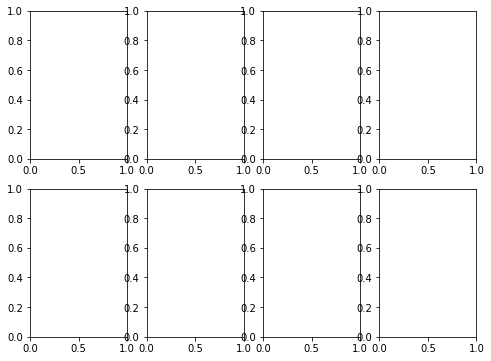

In [50]:
ambiencelist = df_merged.filter(like='Ambience').columns.tolist()
y = int(len(ambiencelist)/2)
fig, ax =plt.subplots(2, y, figsize=(8,6))
for i in range(2):
    for j in range(y):
        #print(i,j,ambiencelist[0])
        sns.countplot(df_merged[ambiencelist[0]], ax=ax[i,j], palette="Set1")
        del ambiencelist[0]
fig.tight_layout()        

In [ ]:
bplist = yelp_attr.filter(like='BusinessParking').columns.tolist()
y = int(len(bplist)/2)
fig, ax =plt.subplots(2, y, figsize=(8,6))
for i in range(2):
    for j in range(y):
        #print(i,j,ambiencelist[0])
        sns.countplot(yelp_attr[bplist[0]], ax=ax[i,j], palette="Set1")
        del bplist[0]
fig.tight_layout()        

In [ ]:
bnlist = yelp_attr.filter(like='BestNights').columns.tolist()
y = int(len(bnlist)/2)
fig, ax =plt.subplots(2, y, figsize=(8,6))
for i in range(2):
    for j in range(y):
        #print(i,j,ambiencelist[0])
        sns.countplot(yelp_attr[bnlist[0]], ax=ax[i,j], palette="Set1")
        del bnlist[0]
fig.tight_layout()        

In [ ]:
meallist = yelp_attr.filter(like='GoodForMeal').columns.tolist()
y = int(len(meallist)/2)
fig, ax =plt.subplots(2, y, figsize=(8,6))
for i in range(2):
    for j in range(y):
        sns.countplot(yelp_attr[meallist[0]], ax=ax[i,j], palette="Set1")
        del meallist[0]
fig.tight_layout()        

In [ ]:
dtlist = yelp_attr.filter(like='DietaryRestrictions').columns.tolist()
del dtlist[0]
y = int(len(dtlist)/2)
fig, ax =plt.subplots(2, y, figsize=(8,6))
for i in range(2):
    for j in range(y):
        sns.countplot(yelp_attr[dtlist[0]], ax=ax[i,j], palette="Set1")
        del dtlist[0]
fig.tight_layout()        

### look for variables that affect or are related to stars and positive reviews..
what makes a positive review...

In [329]:
#!pip install squarify
import squarify
import nltk
from nltk.corpus import stopwords 
from nltk.stem.porter import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
import string
import re 
# !pip install gensim
import gensim 
from gensim import corpora


In [ ]:
# Meta feature of text
tips['num_words'] = tips['text'].str.len()
tips['num_uniq_words'] = tips['text'].apply(lambda x: len(set(str(x).split())))
tips['num_chars'] = tips['text'].apply(lambda x: len(str(x)))
tips['num_stopwords'] = tips['text'].apply(lambda x: len([w for w in str(x).lower().split() 
                                                      if w in set(stopwords.words('english'))]))